# Data Processing


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r '/content/drive/MyDrive/DeepLearning/DentexDataSet/Processed/data' /content/data

In [ ]:
# !rm -r data/

### Install Requirements (Ultralytics)

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 32.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 68.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 101.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

# Data.yaml file

The data.yaml file is used to configure your dataset when training YOLO models. It tells the model:


*   Where our training and validation images are (train: and val:)
*   How many object classes we have (nc:)
*   What the class names are (names:)

In [1]:
with open("data.yaml", "w") as f:
    f.write("""
train: data/train/images
val: data/val/images

nc: 4
names: ['Impacted', 'Caries', 'Periapical Lesion', 'Deep Caries']
""")

# Training Model

### Training Parameters

**Model architecture & size**

**Number of epochs**

**Resolution**

In [ ]:
!yolo detect train data=/content/data.yaml model=yolov8n.pt epochs=100 imgsz=640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100% 6.25M/6.25M [00:00<00:00, 114MB/s]
Ultralytics 8.3.125 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, io

## Test Model

With the model trainned, now we must test it! The commands bellow run the model on the images in the validation folder and then display the results for the first 10 images.

In [ ]:
!yolo detect predict model=runs/detect/train/weights/best.pt source=data/val/images save=True

Ultralytics 8.3.123 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs

image 1/551 /content/data/val/images/train_0.jpg: 320x640 1 Impacted, 4 Cariess, 53.7ms
image 2/551 /content/data/val/images/train_100.jpg: 352x640 1 Impacted, 5 Cariess, 37.8ms
image 3/551 /content/data/val/images/train_101.jpg: 320x640 5 Cariess, 1 Deep Caries, 8.3ms
image 4/551 /content/data/val/images/train_102.jpg: 384x640 3 Cariess, 37.1ms
image 5/551 /content/data/val/images/train_103.jpg: 288x640 3 Impacteds, 1 Caries, 37.2ms
image 6/551 /content/data/val/images/train_104.jpg: 320x640 1 Impacted, 10 Cariess, 1 Deep Caries, 7.7ms
image 7/551 /content/data/val/images/train_105.jpg: 320x640 3 Impacteds, 6 Cariess, 2 Deep Cariess, 6.9ms
image 8/551 /content/data/val/images/train_107.jpg: 352x640 5 Cariess, 7.7ms
image 9/551 /content/data/val/images/train_108.jpg: 320x640 8 Cariess, 7.8ms
image 10/551 /content/data/val/im

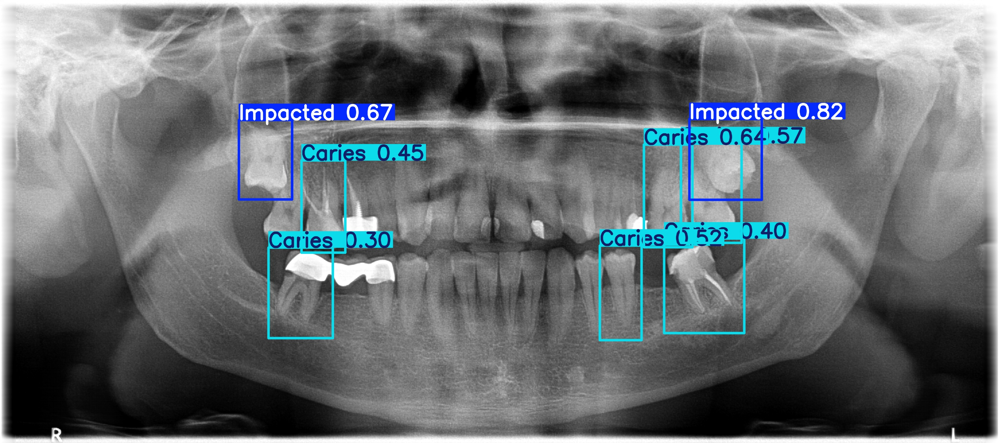

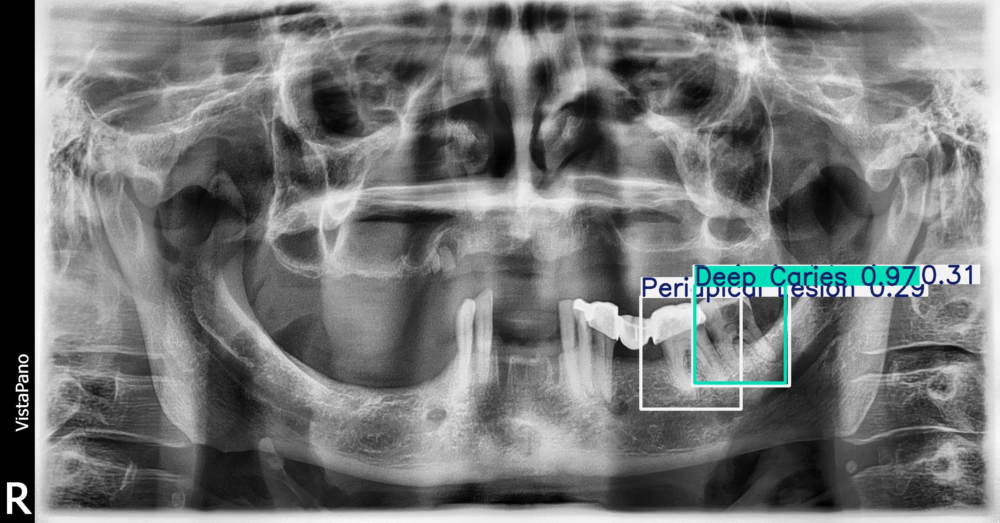

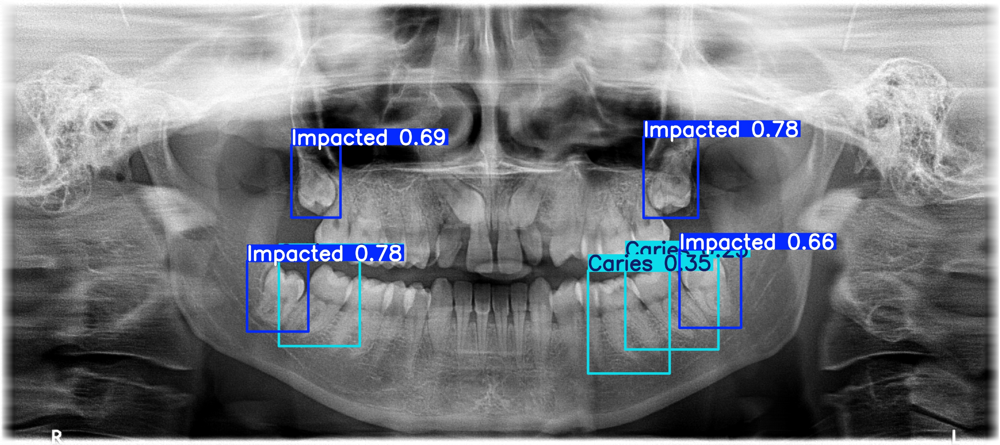

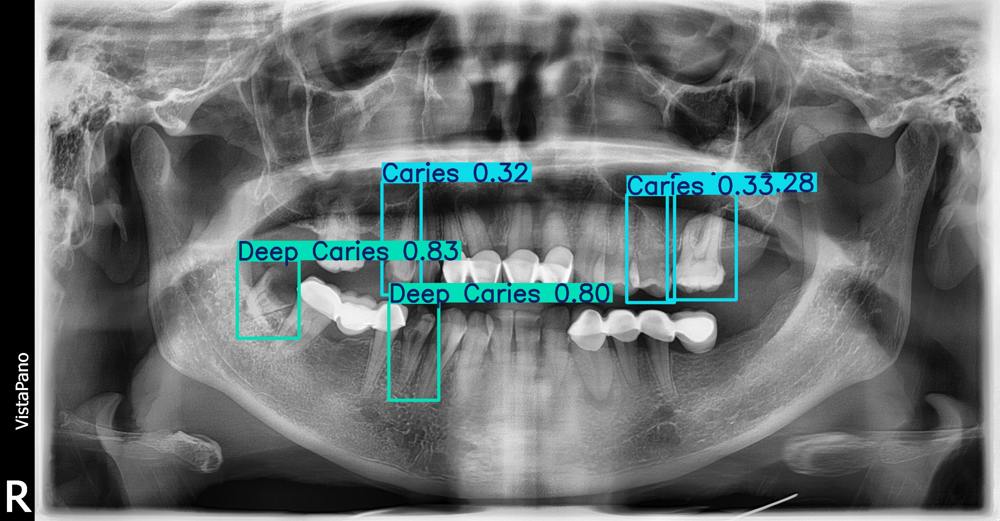

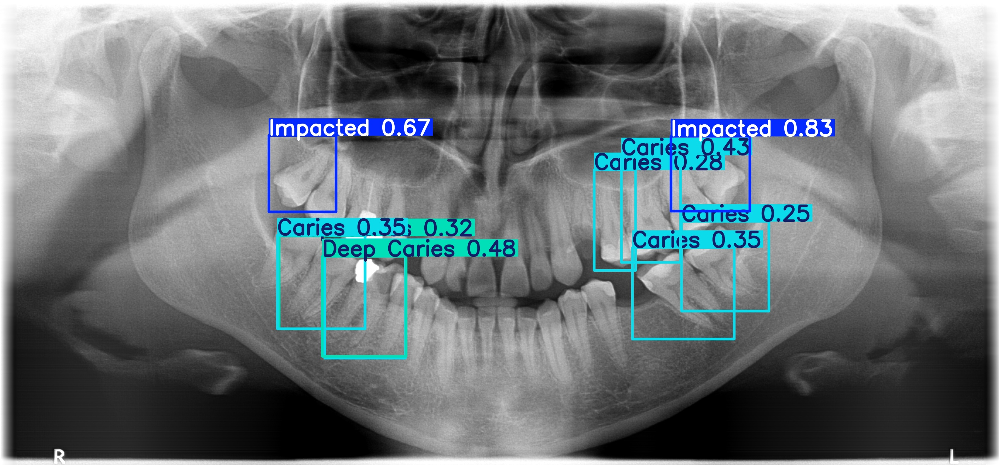

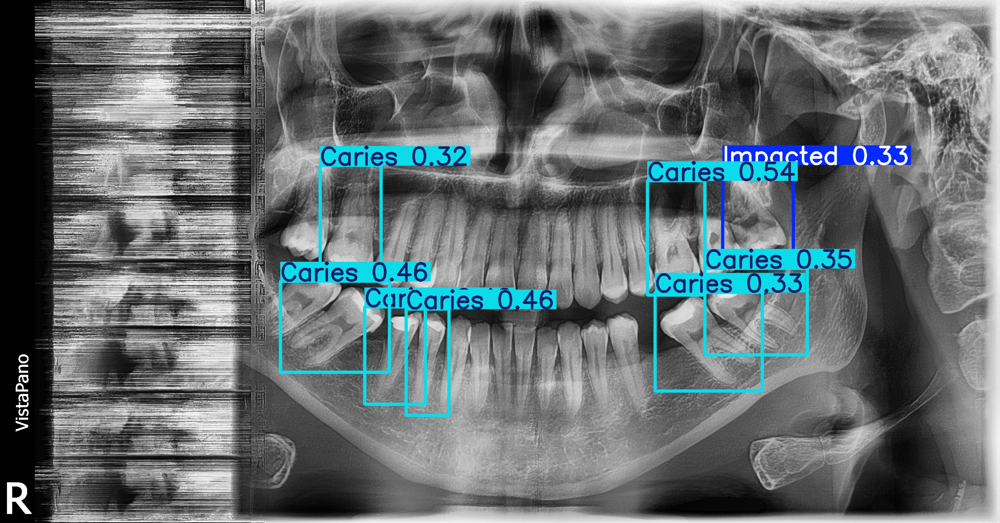

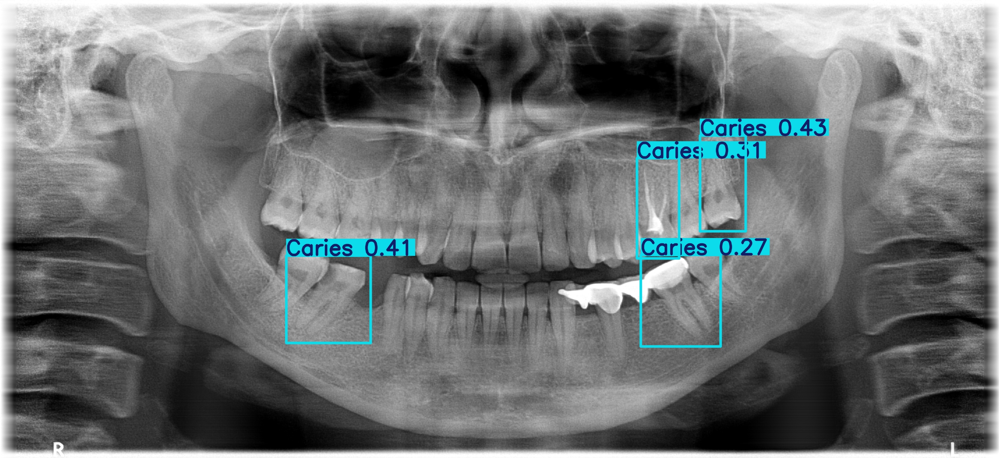

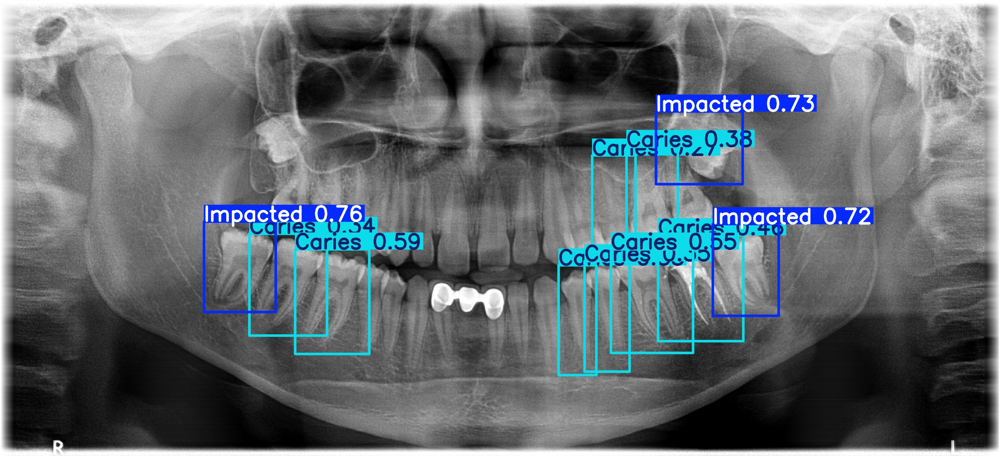

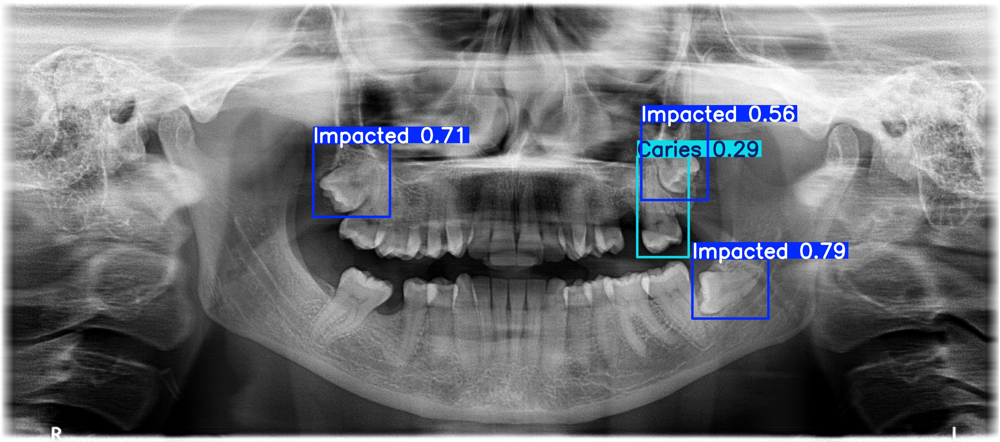

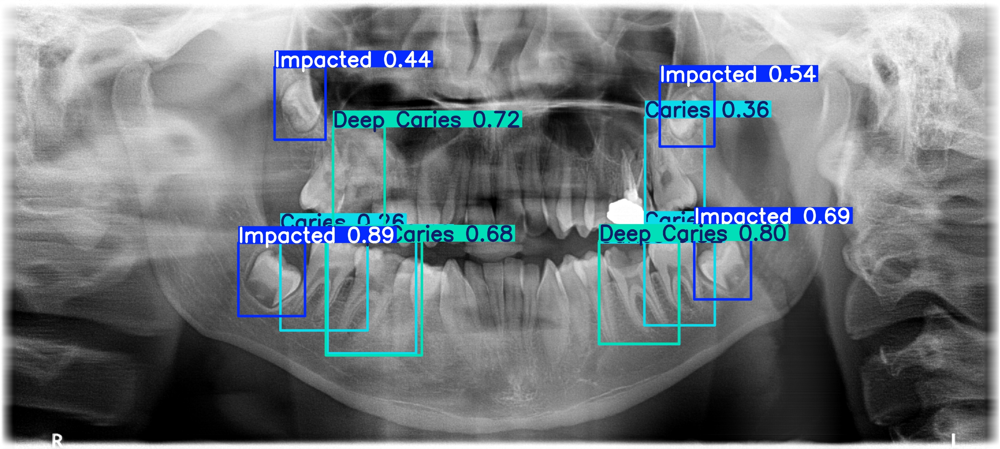

In [ ]:
import glob
from IPython.display import Image, display
for image_path in glob.glob('runs/detect/predict/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')